<a href="https://colab.research.google.com/github/r3m3dial-g3nius/C964_Capstone/blob/main/C964_dog_breed_classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Multi Class Dog Breed Classification
This notebook builds a multiclass image classifier using TensorFlow 2.15.0 and TensorFlow Hub 0.16.1

## 1. Problem

Identify the breed of a dog in an image

## 2. Data

The data used is from Kaggle's dog breed identification competition.
https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Info about the data:

* 20,000+ images (unstructured data)
* Multiclass identification (120 classes)
* 10,000+ images in the training set (labelled)
* 10,000+ images in the test set (not labeled)



# Prep workspace

## Mount Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Unzip the uploaded data into Google Drive

In [ ]:
# ----------------------   Commented out during testing  -----------------------------

!unzip "/content/drive/My Drive/Colab_Notebooks/dog-breed-classifier/dog-breed-identification.zip" -d "/content/drive/My Drive/Colab_Notebooks/dog-breed-classifier/"


Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/My Drive/Colab_Notebooks/dog-breed-classifier/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: /content/drive/My Drive/Colab_Notebooks/dog-breed-classifier/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: /content/drive/My Drive/Colab_Notebooks/dog-breed-classifier/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: /content/drive/My Drive/Colab_Notebooks/dog-breed-classifier/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: /content/drive/My Drive/Colab_Notebooks/dog-breed-classifier/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: /content/drive/My Drive/Colab_Notebooks/dog-breed-classifier/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: /content/drive/My Drive/Colab_Notebooks/dog-breed-classifier/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: /content/drive/My Drive/Colab_Notebooks/dog-breed-classifier/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg

In [ ]:
# Import TensorFlow into Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TensorFlow version: ", tf.__version__)
print("Hub version: ", hub.__version__)

# Check for GPU availability
print("GPU", "available \( ᐖ)/ " if tf.config.list_physical_devices("GPU") else "not available! ¯\_(ツ)_/¯ ")

TensorFlow version:  2.15.0
Hub version:  0.16.1
GPU available :)


## Check the labels on the data

In [ ]:
import pandas as pd

# Check the labels on the data
labels_csv = pd.read_csv("drive/My Drive/Colab_Notebooks/dog-breed-classifier/labels.csv")

In [ ]:
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


### How many images exist for each unique breed?

<Axes: >

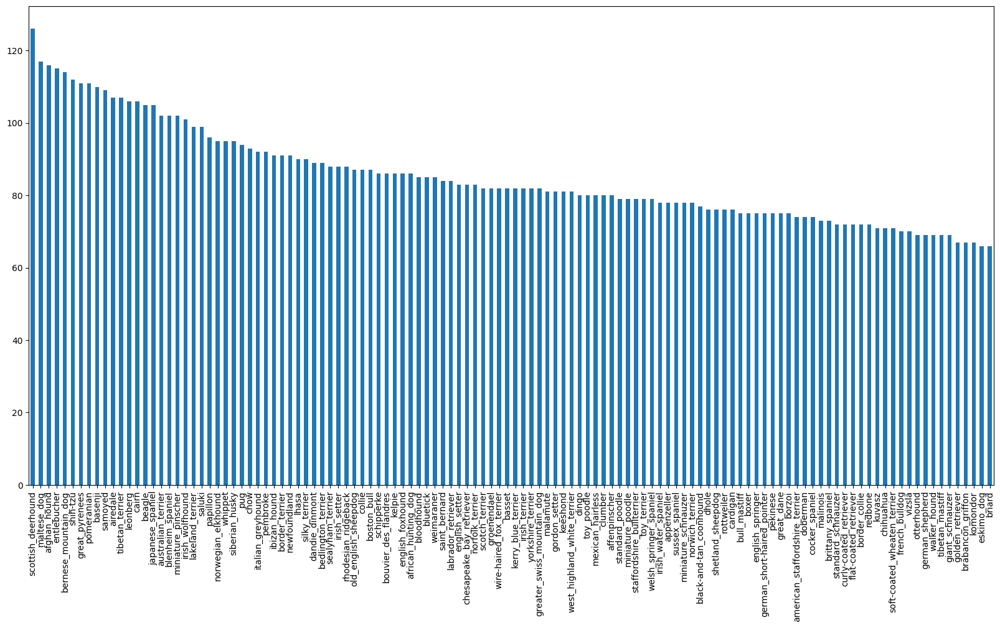

In [ ]:
# How many images exist for each breed?
labels_csv.breed.value_counts().plot.bar(figsize=(20,10))

In [ ]:
# Median number of images per class
labels_csv.breed.value_counts().median()

82.0

### View a sample image

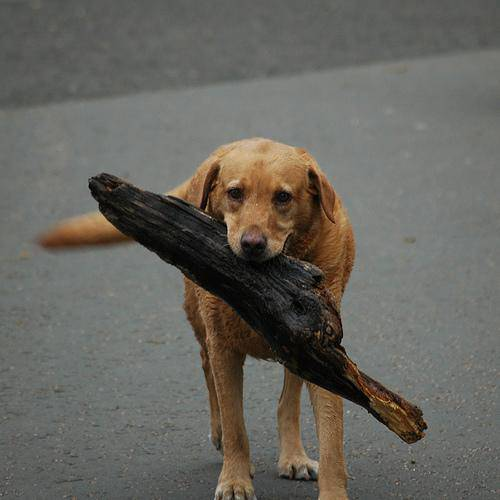

In [ ]:
# View an image
from IPython.display import Image

Image("drive/My Drive/Colab_Notebooks/dog-breed-classifier/train/0021f9ceb3235effd7fcde7f7538ed62.jpg")

### Get a list of all image file pathnames

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image IDs
filepaths = ["drive/My Drive/Colab_Notebooks/dog-breed-classifier/train/" + fname + ".jpg" for fname in labels_csv.id]

# Check first 10
filepaths[:10]

['drive/My Drive/Colab_Notebooks/dog-breed-classifier/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Colab_Notebooks/dog-breed-classifier/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Colab_Notebooks/dog-breed-classifier/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Colab_Notebooks/dog-breed-classifier/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Colab_Notebooks/dog-breed-classifier/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Colab_Notebooks/dog-breed-classifier/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Colab_Notebooks/dog-breed-classifier/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Colab_Notebooks/dog-breed-classifier/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Colab_Notebooks/dog-breed-classifier/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Colab_Notebooks/dog-breed-classifier/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Verify length of filepaths to original data source
import os

if len(os.listdir("drive/My Drive/Colab_Notebooks/dog-breed-classifier/train/")) == len(filepaths):
  print("Number of filepaths match number of files \( ᐖ)/ ")
else:
  print("CAUTION - Number of filepaths do not match number of files! Check target directory.  ¯\_(ツ)_/¯ ")

Number of filepaths match number of files \( ᐖ)/ 


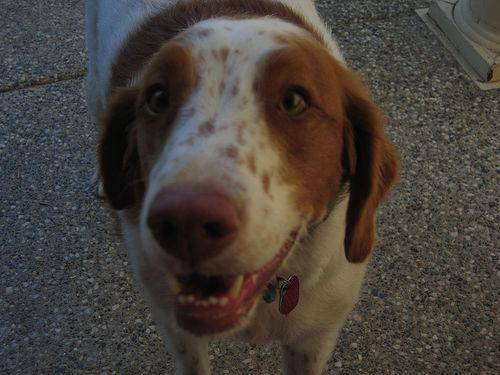

In [ ]:
# Check filepaths shortcut
Image(filepaths[77])

In [ ]:
labels_csv.breed[77]

'brittany_spaniel'

## Prep the labels

In [ ]:
import numpy as np

labels = labels_csv.breed
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# Verify length of labels to length of filepaths

if len(labels) == len(filepaths):
  print("Number of labels match number of filepaths :)")
else:
  print("CAUTION - Number of labels do not match number of filepaths! Check data directories.  ¯\_(ツ)_/¯")

Number of labels match number of filepaths :)


In [ ]:
# Identify unique label values
unique_breeds = np.unique(labels)
print(unique_breeds[:20])
print(len(unique_breeds))

['affenpinscher' 'afghan_hound' 'african_hunting_dog' 'airedale'
 'american_staffordshire_terrier' 'appenzeller' 'australian_terrier'
 'basenji' 'basset' 'beagle' 'bedlington_terrier' 'bernese_mountain_dog'
 'black-and-tan_coonhound' 'blenheim_spaniel' 'bloodhound' 'bluetick'
 'border_collie' 'border_terrier' 'borzoi' 'boston_bull']
120


In [ ]:
# Convert each label to boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:3]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

## Create a validation set

In [ ]:
# setup X & y
X = filepaths
y = boolean_labels

In [ ]:
len(X)

10222

In [ ]:
# Experiment w subset of 1k images - increase as needed

# Create a slider
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Split the data into training and validation sets
from sklearn.model_selection import train_test_split

# use NUM_IMAGES slider to determine subset size
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

## Preprocess images into Tensors

Create preprocessing function to:
1. Take image filepath as input
2. Use TensorFlow to read the file and save it to a variable, 'image'
3. Convert 'image.jpg' into Tensors
4. Normalize image (convert color channel values from 0-255 to 0-1)
5. Resize 'image' to be a shape of (224, 224)
6. Return modified 'image'

In [ ]:
# Define image size
IMG_SIZE = 224

# Create preprocess_image function
def preprocess_image(image_path, img_size=IMG_SIZE):
  """
  Takes image and converts to Tensor
  """
  # Read in image file
  image = tf.io.read_file(image_path)
  # Convert image.jpg into numerical Tensor w 3 color channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)
  # Normalize image - Convert color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize image
  image= tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


## Turn data into batches

Split data into batches of 32 tuples in this format: (image, label)

In [ ]:
# Create a function that returns a tuple
def get_image_label(image_path, label):
  """
  Takes an image filepath name and associated label,
  processes the image,
  returns a tuple (image, label).
  """
  image = preprocess_image(image_path)
  return image, label

In [ ]:
# Demo above function
(preprocess_image(X[42], tf.constant(y[42])))

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117757],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 ],
        [0.01

In [ ]:
# Create a function to convert all of the data (X & y) into batches

# Define batch size
BATCH_SIZE = 32

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image 'X' and label 'y' pairs.
  Shuffles the data if its training data, but not validation data.
  Also accepts test data as input (no labels).
  """
  # If data is test dataset, there are no labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))   # only filepaths, no labels
    data_batch = data.map(preprocess_image).batch(BATCH_SIZE)
    return data_batch

  # If data is valid dataset, data is NOT shuffled
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                              tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  # If data is training dataset, shuffle the data
  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffle the pathnames and labels before mapping
    data = data.shuffle(buffer_size=len(X))

    # Create image label tuples () **This also turns image path into a preprocessed image**
    data = data.map(get_image_label)

    # Turn training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch


In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Review elements of data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing an image in a databatch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a databatch.
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop thru 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 cols)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # grid lines off
    plt.axis("off")

### Visualize a sample of the training data

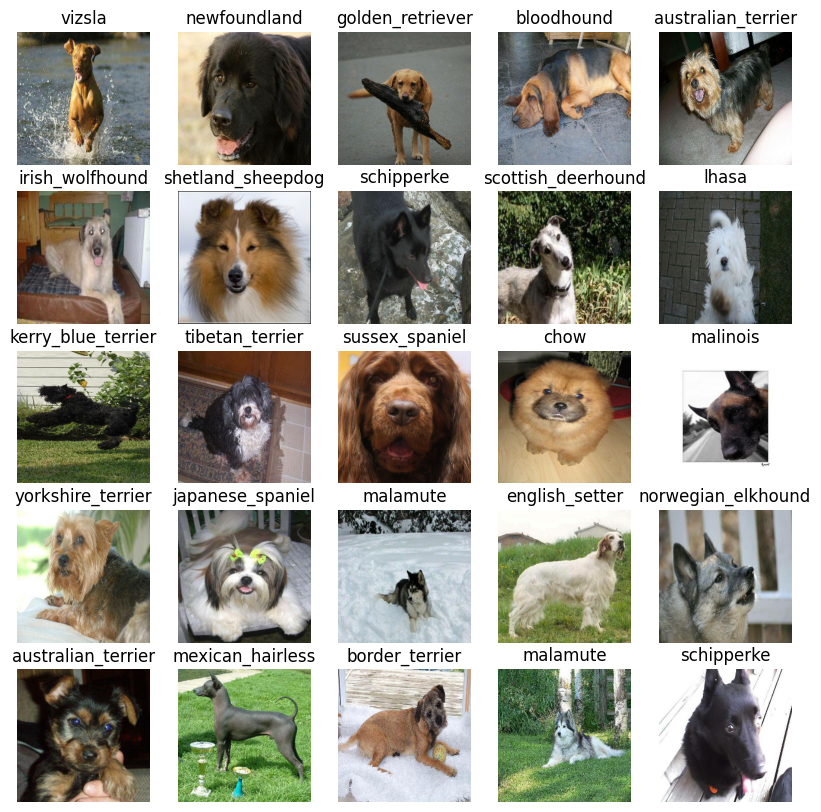

In [ ]:
# Visualize the training data using custom function from above:
train_images, train_labels = next(train_data.as_numpy_iterator())

show_25_images(train_images, train_labels)

In [ ]:
len(train_images), len(train_labels)

(32, 32)

### Visualize a sample of the test data

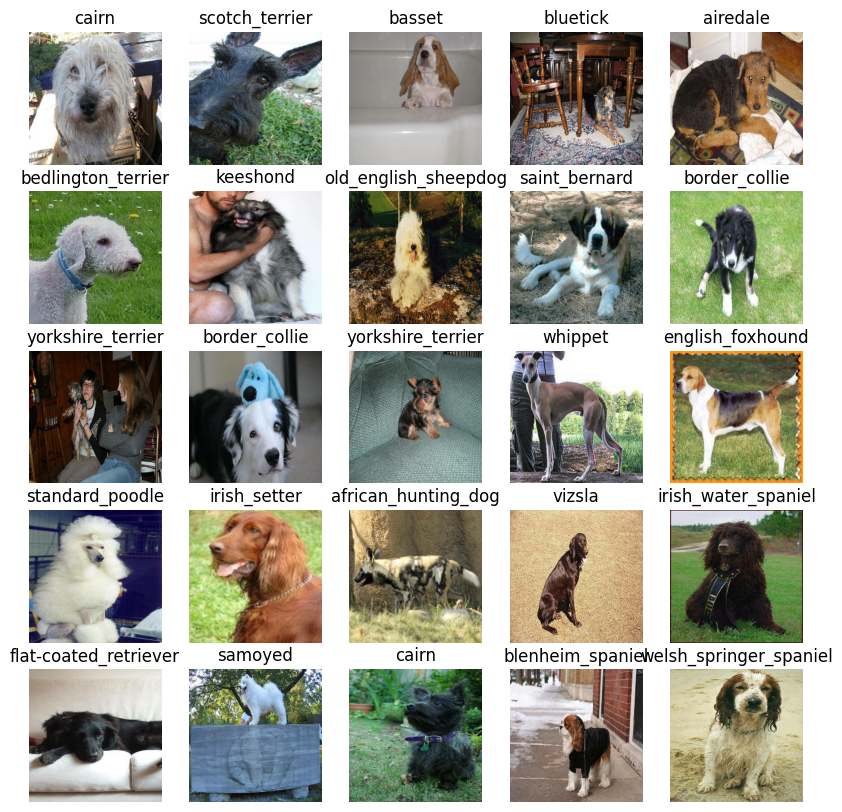

In [ ]:
# Visualize the validation set

val_images, val_labels = next(val_data.as_numpy_iterator())

show_25_images(val_images, val_labels)

# Build a model
* Define input shape (in the form of Tensors)
* Define the output shape (in the form of Tensors)
* URL of model from TensorFlow Hub

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

# Setup output shape
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

## Create a function to:

* Take input shape, output shape, and model chosen as parameters
* Define layers in Keras model in sequential fashion
* Compile the model
* Build the model
* Return the model

In [ ]:
# Create function that builds Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  """
  Creates a function that builds a Keras model
  """
  print("Building model with: ", MODEL_URL)

  # Setup model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
      activation="softmax")   # Layer 2 (Outputlayer)
      ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks

A callback is a helper function that a model can use during training to save progress, check progress, or stop training early if model stops improving.

Two callbacks are created here. One for TensorBoard which helps track the model's progress. A second for early stopping which prevents the model from training for too long.

In [ ]:
# Load Tensorboard notebook extension
!pip install tensorboard
%load_ext tensorboard

### TensorBoard callback
1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's 'fit()' function.
3. Visualize the model's training logs with the %tensorboard magic function.

In [ ]:
import datetime

# Create a function to callback a tensorboard callback
def create_tensorboard_callback():
  # create a log directory for storing Tensorboard logs
  logdir = os.path.join("drive/MyDrive/Colab_Notebooks/dog-breed-classifier/logs",  # make the logs get tracked when running an experiment
                       datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback

Early stopping helps the model from overfitting by stopping training if a certain evaluation metric stops improving.

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Train a model (on a subset of data)
Train on 1k images to test all functionality

In [ ]:
NUM_EPOCHS = 10 #@param {type: "slider", min:10, max:100, step:10}

In [ ]:
# Verify GPU
print("GPU", "available :)" if tf.config.list_physical_devices("GPU") else "not available! ¯\_(ツ)_/¯ ")

GPU available :)


Create a function that trains a model
* create a model using 'create_model()'
* setup a tensorboard callback using 'create_tensorboard_callback()'
* Call the 'fit()' function on the model passing the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks to use
* Return the model

In [ ]:
# Build function to build and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version of that model.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime a model is trained
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data, passing the created callbacks
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/10
25/25 [==============================] - 17s 312ms/step - loss: 4.5744 - accuracy: 0.1088 - val_loss: 3.5021 - val_accuracy: 0.2100
Epoch 2/10
25/25 [==============================] - 5s 194ms/step - loss: 1.6401 - accuracy: 0.6875 - val_loss: 2.1941 - val_accuracy: 0.4700
Epoch 3/10
25/25 [==============================] - 6s 239ms/step - loss: 0.5755 - accuracy: 0.9400 - val_loss: 1.7472 - val_accuracy: 0.5650
Epoch 4/10
25/25 [==============================] - 4s 150ms/step - loss: 0.2582 - accuracy: 0.9812 - val_loss: 1.5515 - val_accuracy: 0.6100
Epoch 5/10
25/25 [==============================] - 4s 170ms/step - loss: 0.1464 - accuracy: 0.9975 - val_loss: 1.4553 - val_accuracy: 0.6150
Epoch 6/10
25/25 [==============================] - 7s 273ms/step - loss: 0.1020 - accuracy: 0.9987 - val_loss: 1.4091 - val_accuracy: 0.6200
Epoch 7/10
25/25 [==============================] - 4

### Checking the TensorBoard logs
Tensorboard magic function ('%tensorboard') accesses the logs directory and visualizes the contents.

In [ ]:
%tensorboard --logdir "drive/My Drive/Colab_Notebooks/dog-breed-classifier/logs"

<IPython.core.display.Javascript object>

# Make and evaluate predictions using a trained model

In [ ]:
# Make prediction on validation data
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 186ms/step


array([[1.1313066e-03, 6.7892390e-05, 3.5752030e-04, ..., 1.8081773e-04,
        1.8525907e-05, 9.5626578e-04],
       [3.7745766e-03, 6.3177274e-04, 9.8694470e-03, ..., 1.3660913e-03,
        1.5590375e-03, 1.6795000e-04],
       [5.9228409e-05, 5.2084724e-05, 1.9609151e-05, ..., 1.7145019e-05,
        3.5061661e-05, 1.7243352e-05],
       ...,
       [1.3291614e-05, 1.2607775e-04, 2.6728178e-04, ..., 1.1089303e-05,
        2.9677295e-04, 1.5466353e-04],
       [9.6115824e-03, 2.1850607e-04, 2.2519412e-04, ..., 1.2552184e-04,
        4.7251673e-05, 3.4523085e-02],
       [9.0500945e-04, 1.2568814e-04, 1.1664469e-03, ..., 3.9561829e-03,
        1.5943773e-03, 3.0023602e-05]], dtype=float32)

In [ ]:
# First prediction

index = 68
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.8821057e-03 5.9470156e-04 1.3900938e-03 2.3391140e-04 2.1921353e-04
 1.5225298e-03 3.7511756e-05 1.2744283e-03 8.3232604e-05 1.5917649e-04
 1.7396202e-04 1.3687994e-04 1.5143646e-04 1.8028961e-04 3.9235823e-04
 1.5371785e-04 2.3161195e-02 1.2526597e-04 2.9779151e-03 1.3680529e-04
 1.8962241e-04 1.0113422e-03 2.8890648e-04 7.0101778e-05 2.7219256e-04
 1.3400938e-03 3.0260787e-03 8.2071166e-04 4.3143853e-04 6.3623290e-04
 5.0366754e-03 8.5771717e-05 1.6901081e-03 3.3275206e-02 9.7541233e-05
 2.6839833e-05 6.9416815e-04 1.0552980e-03 9.0205396e-04 1.7331257e-04
 7.4262486e-04 3.8151207e-04 1.8546826e-04 5.7296466e-02 1.0908776e-03
 6.4560901e-03 1.1197698e-03 4.0905451e-04 1.7508598e-04 1.3550631e-04
 9.6168478e-05 1.2230131e-04 3.2562356e-02 6.2887929e-04 2.5625201e-02
 7.3987077e-04 2.8823415e-04 8.7198234e-05 9.2222833e-04 4.6960115e-03
 4.6459096e-04 2.1735944e-04 1.4763193e-01 8.9445809e-04 2.6940217e-04
 3.2524735e-04 2.9602307e-03 7.1324623e-04 7.2140200e-04 1.0953138e-03
 3.237

In [ ]:
# Turn prediction probabilities into their respective label

def get_pred_label(prediction_probabilities):
  """
  Turns array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[2])
pred_label


'basset'

In [ ]:
# Create a function to unbatch a batched dataset
def unbatch(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels.
  """
  images = []
  labels = []

  # Loop thru unbatched data
  for image, label in val_data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

Unbatch validation data in order to make predictions. Then compare predictions to validation labels (true values)

In [ ]:
# Unbatch the validation data
val_images, val_labels = unbatch(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, truth, and image sample for n)
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change color of the title depending on prediction being correct or incorrect
  if pred_label==true_label:
    color = "green"
  else:
    color = "red"


  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color)


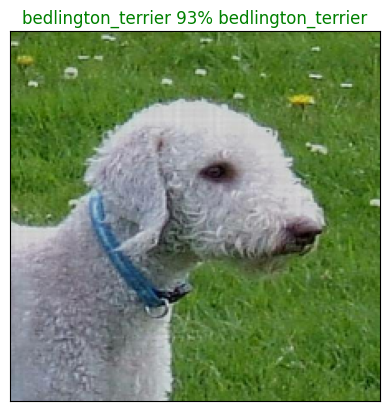

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=5)

## Create a function to view top 10 predictions
* takes an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using 'get_pred_label()'
* Find the top 10
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label *green*

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction conferences with truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the prediction label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction conference indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # setup plot
  top_10_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                        top_10_pred_values,
                        color="grey")
  plt.xticks(np.arange(len(top_10_pred_values)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_10_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass




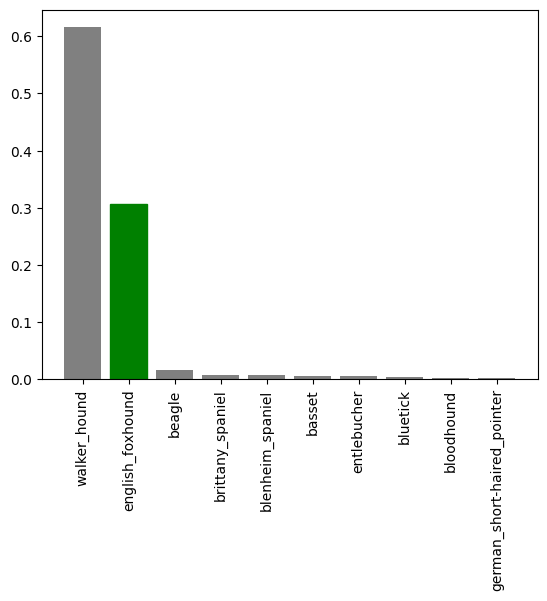

In [ ]:
plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=42)

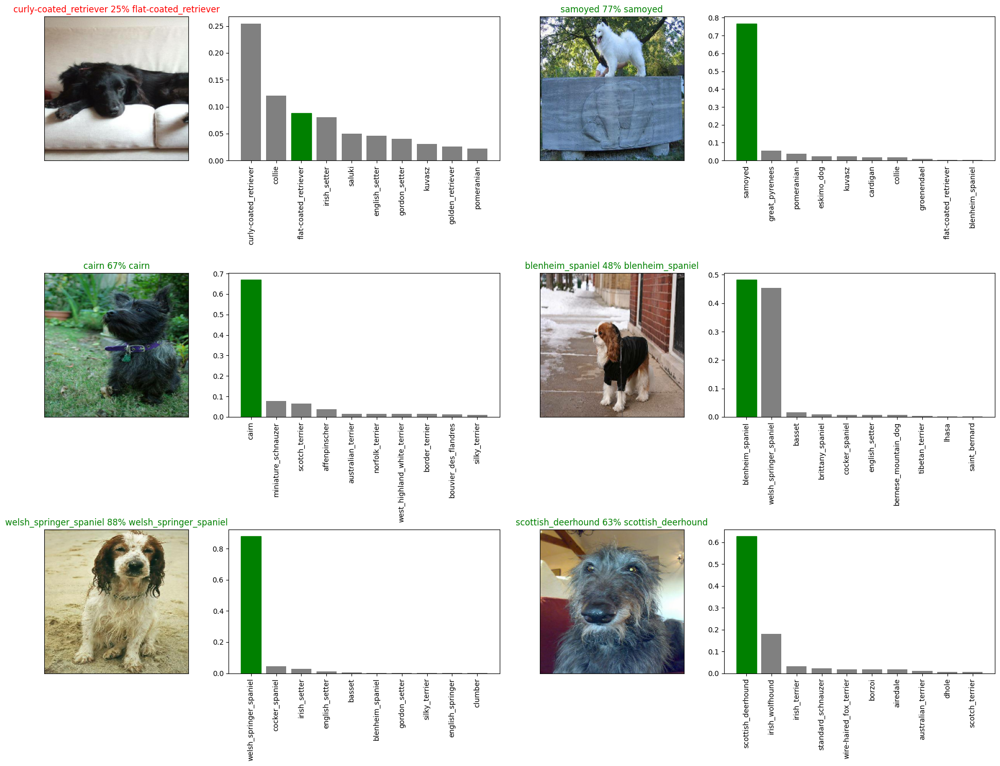

In [ ]:
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols

plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
  plt.tight_layout(h_pad=1.0)

plt.show();

## Save the trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a model directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  model_dir = os.path.join("drive/My Drive/Colab_Notebooks/dog-breed-classifier/models",
                           datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = model_dir + "-" + suffix + ".h5"   # save format of model

  print(f"Saving model to:  {model_path}...")

  model.save(model_path)

  return model_path

In [ ]:
# Create a function to load the model
def load_model(model_path):
  """
  Loads a saved model from specified path
  """
  print(f"Loading saved model from:  {model_path}")
  model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer":hub.KerasLayer})

  return model

In [ ]:
# save model trained on 1k images
saved_model = save_model(model, suffix="1000-images-Adam")

Saving model to:  drive/My Drive/Colab_Notebooks/dog-breed-classifier/models/20240208-20511707425466-1000-images-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# Load a trained model
loaded_1000_image_model = load_model(saved_model)

Loading saved model from:  drive/My Drive/Colab_Notebooks/dog-breed-classifier/models/20240208-20511707425466-1000-images-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 106ms/step - loss: 1.3188 - accuracy: 0.6350


[1.3188198804855347, 0.6349999904632568]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 105ms/step - loss: 1.3188 - accuracy: 0.6350


[1.3188198804855347, 0.6349999904632568]

# Training the model on full data

In [ ]:
# Create data batch with full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
# Fit the full model to the full data  -------------------> Could take some time!
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/10
320/320 [==============================] - 47s 147ms/step - loss: 0.3454 - accuracy: 0.9022
Epoch 2/10
320/320 [==============================] - 48s 149ms/step - loss: 0.2077 - accuracy: 0.9420
Epoch 3/10
320/320 [==============================] - 50s 156ms/step - loss: 0.1358 - accuracy: 0.9699
Epoch 4/10
320/320 [==============================] - 49s 152ms/step - loss: 0.0955 - accuracy: 0.9800
Epoch 5/10
320/320 [==============================] - 46s 145ms/step - loss: 0.0684 - accuracy: 0.9908
Epoch 6/10
320/320 [==============================] - 47s 148ms/step - loss: 0.0525 - accuracy: 0.9930
Epoch 7/10
320/320 [==============================] - 49s 152ms/step - loss: 0.0431 - accuracy: 0.9951
Epoch 8/10
320/320 [==============================] - 48s 150ms/step - loss: 0.0360 - accuracy: 0.9967
Epoch 9/10
320/320 [==============================] - 45s 141ms/step - loss: 0.0301 - accuracy: 0.9976
Epoch 10/10
320/320 [==============================] - 49s 153ms/step - l

In [ ]:
saved_full_model_path = save_model(full_model, suffix="full_image_set_Adam")

Saving model to:  drive/My Drive/Colab_Notebooks/dog-breed-classifier/models/20240208-21071707426434-full_image_set_Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
loaded_full_model = load_model(saved_full_model_path)

Loading saved model from:  drive/My Drive/Colab_Notebooks/dog-breed-classifier/models/20240208-21071707426434-full_image_set_Adam.h5


# Make predictions using fully loaded model on test data set

## Prep the data

### Load test image filenames

In [ ]:
test_path = "drive/My Drive/Colab_Notebooks/dog-breed-classifier/test/"

test_filenames = [test_path + fname for fname in os.listdir(test_path)]

test_filenames[:10]

['drive/My Drive/Colab_Notebooks/dog-breed-classifier/test/000621fb3cbb32d8935728e48679680e.jpg',
 'drive/My Drive/Colab_Notebooks/dog-breed-classifier/test/00102ee9d8eb90812350685311fe5890.jpg',
 'drive/My Drive/Colab_Notebooks/dog-breed-classifier/test/0012a730dfa437f5f3613fb75efcd4ce.jpg',
 'drive/My Drive/Colab_Notebooks/dog-breed-classifier/test/001510bc8570bbeee98c8d80c8a95ec1.jpg',
 'drive/My Drive/Colab_Notebooks/dog-breed-classifier/test/001a5f3114548acdefa3d4da05474c2e.jpg',
 'drive/My Drive/Colab_Notebooks/dog-breed-classifier/test/00225dcd3e4d2410dd53239f95c0352f.jpg',
 'drive/My Drive/Colab_Notebooks/dog-breed-classifier/test/002c2a3117c2193b4d26400ce431eebd.jpg',
 'drive/My Drive/Colab_Notebooks/dog-breed-classifier/test/002c58d413a521ae8d1a5daeb35fc803.jpg',
 'drive/My Drive/Colab_Notebooks/dog-breed-classifier/test/002f80396f1e3db687c5932d7978b196.jpg',
 'drive/My Drive/Colab_Notebooks/dog-breed-classifier/test/0036c6bcec6031be9e62a257b1c3c442.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

## Make the predictions

In [ ]:
# This will take a while!
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 189s 581ms/step


In [ ]:
# Save predictions (NumPy array) to csv file
np.savetxt("drive/My Drive/Colab_Notebooks/dog-breed-classifier/preds_array.csv",
           test_predictions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/My Drive/Colab_Notebooks/dog-breed-classifier/preds_array.csv",
                              delimiter=",")

In [ ]:
test_predictions[:10]

array([[1.93071517e-10, 4.90950336e-11, 1.02299462e-13, ...,
        6.31064949e-12, 2.79471912e-09, 3.89511867e-10],
       [8.17127511e-06, 2.79070755e-05, 1.09968221e-06, ...,
        2.16855178e-09, 4.48966034e-07, 1.47457433e-08],
       [2.74671119e-10, 6.95484550e-06, 7.46405036e-08, ...,
        3.60872491e-06, 2.63672573e-09, 5.49113033e-10],
       ...,
       [4.63123442e-08, 4.55259253e-09, 1.14893766e-08, ...,
        2.50279658e-10, 1.82563704e-11, 1.82217741e-09],
       [1.86626256e-10, 1.99290149e-08, 5.40106715e-09, ...,
        1.27296280e-05, 1.85858880e-07, 3.35398737e-10],
       [3.31284724e-08, 1.03920106e-09, 3.34611394e-10, ...,
        3.32379003e-12, 5.79982340e-10, 3.72295318e-07]])

In [ ]:
test_predictions.shape

(10357, 120)

# Prepare the test data predictions for submission

Kaggle requires submission as a dataframe with an ID and column for each unique dog breed.

## Create pandas dataframe

In [ ]:
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions


In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,1.930715e-10,4.909503e-11,1.022995e-13,1.985224e-11,6.736088e-12,2.636072e-10,5.406846e-14,3.533418e-11,1.749715e-12,...,4.069982e-11,7.101766e-12,3.010267e-12,1.149158e-12,3.411282e-12,1.159664e-10,5.565040e-12,6.310649e-12,2.794719e-09,3.895119e-10
1,00102ee9d8eb90812350685311fe5890,8.171275e-06,2.790708e-05,1.099682e-06,4.832233e-08,6.661019e-06,2.661764e-07,6.373312e-06,2.703795e-06,1.910035e-07,...,2.881711e-07,1.367168e-06,7.470588e-08,1.702540e-05,3.175889e-07,1.875830e-06,9.042405e-04,2.168552e-09,4.489660e-07,1.474574e-08
2,0012a730dfa437f5f3613fb75efcd4ce,2.746711e-10,6.954846e-06,7.464050e-08,3.689154e-09,1.277550e-08,1.722109e-07,2.985681e-10,7.600329e-11,8.490705e-08,...,4.169517e-11,3.874075e-10,2.159837e-06,5.576987e-06,1.607633e-07,7.852749e-07,1.217549e-10,3.608725e-06,2.636726e-09,5.491130e-10
3,001510bc8570bbeee98c8d80c8a95ec1,4.093007e-05,1.701188e-06,2.929989e-07,1.264936e-05,3.512702e-04,1.891965e-06,1.574621e-09,1.049116e-07,3.159199e-06,...,3.573750e-06,3.345296e-08,1.637497e-05,5.947706e-09,1.131456e-06,3.324615e-09,1.951498e-13,5.778454e-03,2.882970e-10,1.906108e-07
4,001a5f3114548acdefa3d4da05474c2e,1.512182e-04,3.307963e-05,7.921761e-08,2.144048e-08,1.064168e-08,2.599367e-10,6.078699e-08,2.656585e-08,2.564015e-08,...,5.532917e-07,1.849282e-09,1.427696e-09,2.266223e-10,9.150737e-09,1.137773e-08,6.777948e-10,2.349432e-07,2.961768e-09,5.334383e-07


## Export to csv

In [ ]:
preds_df.to_csv("drive/My Drive/Colab_Notebooks/dog-breed-classifier/full_predictions_submission_Adam.csv",
                index=False)

# User Interface

## Make predictions on custom images

The following 4 random images were manually downloaded from the provided links and placed in the custom_images folder for testing purposes:
"drive/My Drive/Colab_Notebooks/dog-breed-classifier/custom-images/"


1. Golden retriever pic - https://www.freepik.com/free-photo/selective-focus-shot-adorable-golden-retriever-outdoors_17245319.htm#query=dog&position=9&from_view=keyword&track=sph&uuid=56991ce5-3bb0-48ea-989a-b83763cced12

2. Pug - https://www.freepik.com/free-photo/adorable-pug-puppy-solo-portrait_3532466.htm#page=4&query=dog&position=29&from_view=search&track=sph&uuid=e812ff1d-cd33-4e51-9a7d-8154e3fd3054

3. Husky - https://www.freepik.com/free-photo/husky-dog-lying-down_7900876.htm#page=2&query=dog&position=31&from_view=search&track=sph&uuid=4b704358-fec5-4a31-958e-5c905824023d

4. Welch Corgi - https://www.freepik.com/free-photo/washing-pet-dog-home_30994420.htm#page=2&query=dog&position=38&from_view=search&track=sph&uuid=4b704358-fec5-4a31-958e-5c905824023d



## **Here is where any user may use their own dog images (jpeg) and place them into this folder ("drive/My Drive/Colab_Notebooks/dog-breed-classifier/custom-images/") and make predictions.**



In [ ]:
custom_path = "drive/My Drive/Colab_Notebooks/dog-breed-classifier/custom-images/"

In [ ]:
# Check if the folder already exists
if not os.path.exists(custom_path):
    # Create the new folder
    os.makedirs(custom_path)
    print(f"Folder '{custom_path}' created successfully.")
else:
    print(f"Folder '{custom_path}' already exists.")

Folder 'drive/My Drive/Colab_Notebooks/dog-breed-classifier/custom-images/' already exists.


In [ ]:
custom_path_fname = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_path_fname

['drive/My Drive/Colab_Notebooks/dog-breed-classifier/custom-images/husky.jpg',
 'drive/My Drive/Colab_Notebooks/dog-breed-classifier/custom-images/golden_retriever.jpg',
 'drive/My Drive/Colab_Notebooks/dog-breed-classifier/custom-images/welsh_corgi.jpg',
 'drive/My Drive/Colab_Notebooks/dog-breed-classifier/custom-images/pug.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_path_fname, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 0s 103ms/step


In [ ]:
custom_preds.shape

(4, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['siberian_husky', 'golden_retriever', 'pembroke', 'pug']

In [ ]:
# get custom images
# cannot unbatch without labels

custom_images = []

# Loop thru unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

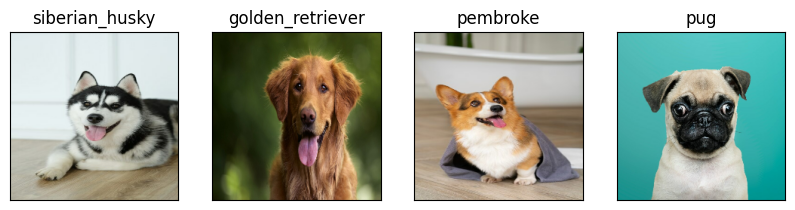

In [ ]:
# Check predictions
plt.figure(figsize=(10, 10))

for i, image in enumerate(custom_images):
  plt.subplot(1, 4, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)